## imports

In [29]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display
import ipywidgets as widgets
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

## Camera Calibration

### find and draw chessboard on a sample calibration image

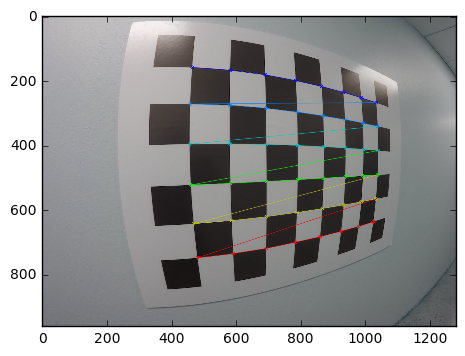

In [30]:
# prepare object points
nx = 8#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

# Make a list of calibration images
fname = '/home/da7th/Desktop/Udacity/sdc/CarND-P4/calibration_wide/GOPR0032.jpg'
cal_img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(cal_img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(cal_img, (nx, ny), corners, ret)
    plt.imshow(cal_img)

### read in the calibration folder and find the objpoints and imgpoints, afterwhich calibrate the camera

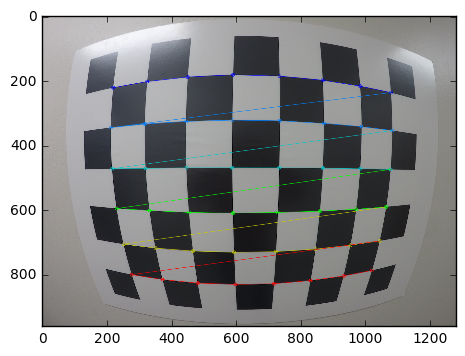

In [31]:
#read in and make a list of calibration images
images = glob.glob('./calibration_wide/GOPR*.jpg')

#arrays to store object points and image points from all the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

#prepare object points, like (0,0,0), (1,0,0), (2,0,0)....,(7,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1, 2) #x, y coordinates

for fname in images:
    #read in each image
    img = mpimg.imread(fname)


    #convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    #find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    #if corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        #draw and display the corners
        img = cv2.drawChessboardCorners(img,(8,6), corners, ret)
        plt.imshow(img)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Distortion Correction

### define the function the will warp the image using the calibration's output params

In [32]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

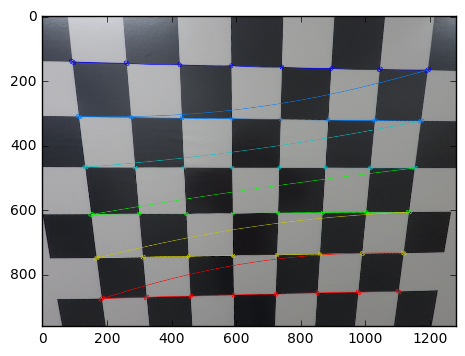

In [33]:
#undistort example image
undist = cv2.undistort(img, mtx, dist, None, mtx)
plt.imshow(undist)

### perform a warp on a smaple calibration image

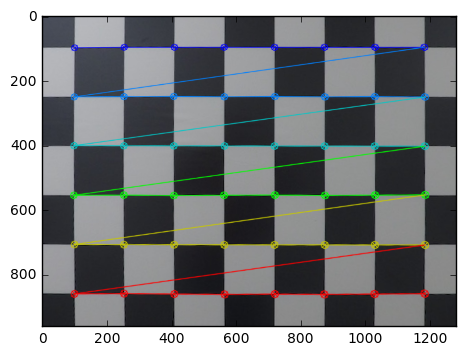

In [34]:
warped_img, M = corners_unwarp(mpimg.imread(images[0]), nx, ny, mtx, dist )
plt.imshow(warped_img)

## Color and Gradient Threshold

### import a smaple road image

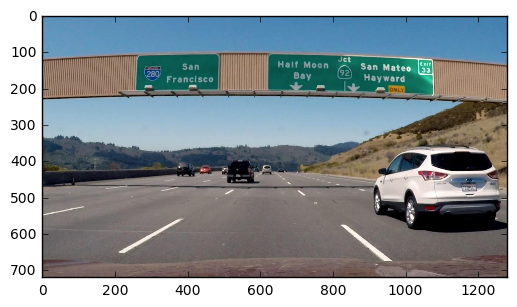

In [35]:
img = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/signs_vehicles_xygrad.png')
plt.imshow(img)

### convert the image into HLS colour space

### applying sobel

(array([[0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 1, 1, 0],
        ..., 
        [0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 1, 1, 0],
        [0, 0, 0, ..., 1, 1, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 1],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8))

<function __main__.abs_sobel_thresh>

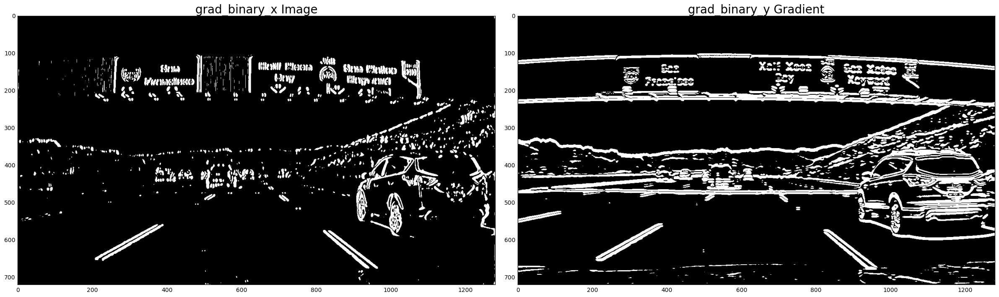

In [36]:
#sobel x
def abs_sobel_thresh(thresh_min_x=20, thresh_max_x=150, thresh_min_y=20, thresh_max_y=150):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = 17)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = 17)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_outputx = np.zeros_like(scaled_sobelx)
    binary_outputx[(scaled_sobelx >= thresh_min_x) & (scaled_sobelx <= thresh_max_x)] = 1
    binary_outputy = np.zeros_like(scaled_sobely)
    binary_outputy[(scaled_sobely >= thresh_min_y) & (scaled_sobely <= thresh_max_y)] = 1
    # 6) Return this mask as your binary_output image
    
    #plot orig, sobel_X and sobel_Y
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(binary_outputx, cmap='gray')
    ax1.set_title('grad_binary_x Image', fontsize=20)
    ax2.imshow(binary_outputy, cmap='gray')
    ax2.set_title('grad_binary_y Gradient', fontsize=20)
    return binary_outputx, binary_outputy

# abs_sobel_thresh(thresh_min_x=20, thresh_max_x=150, thresh_min_y=20, thresh_max_y=150)
interact(abs_sobel_thresh, thresh_min_x=(0,255), thresh_max_x=(0,255), thresh_min_y=(0,255), thresh_max_y=(0,255))

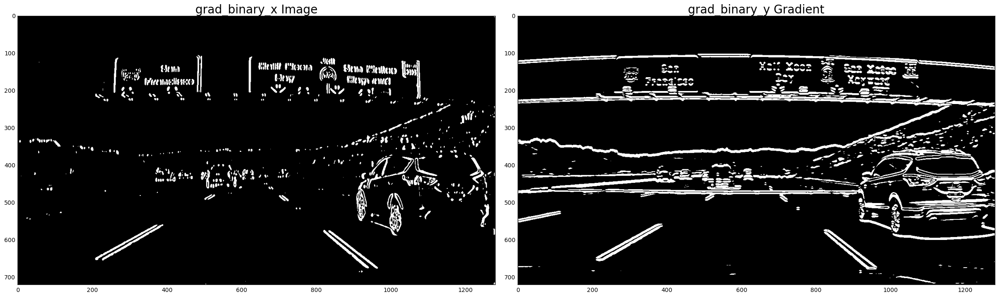

In [37]:
binary_outputx, binary_outputy = abs_sobel_thresh(thresh_min_x=30, thresh_max_x=130, thresh_min_y=30, thresh_max_y=130)

### mag_threshold

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ..., 
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=uint8)

<function __main__.mag_thresh>

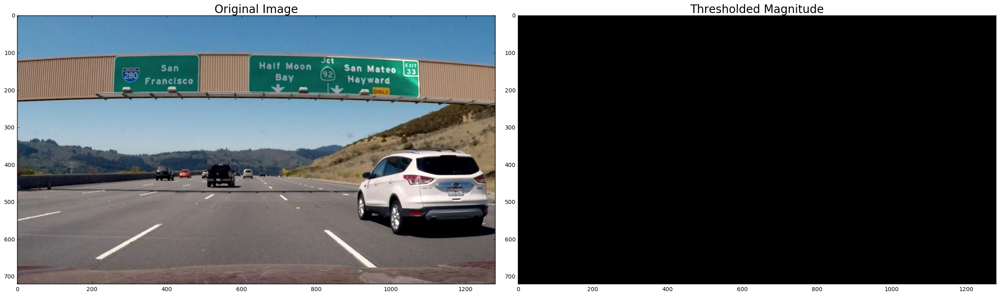

In [38]:
def mag_thresh(sobel_kernel=3,mag_thresh_min=0,mag_thresh_max=255):
    
    if sobel_kernel%2 == 0:
        sobel_kernel = 3
        print("kernel must be odd, resorting to default kernel = 3")
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    abs_sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Calculate the magnitude
    abs_sobel_xy = np.sqrt((np.square(abs_sobel_x))+(np.square(abs_sobel_y)))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel_xy/np.max(abs_sobel_xy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh_min) & (scaled_sobel <= mag_thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    # binary_output = np.copy(img) # Remove this line
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(binary_output, cmap='gray')
    ax2.set_title('Thresholded Magnitude', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return binary_output


interact(mag_thresh, sobel_kernel=(1,21),mag_thresh_min=(0,255),mag_thresh_max=(0,255))

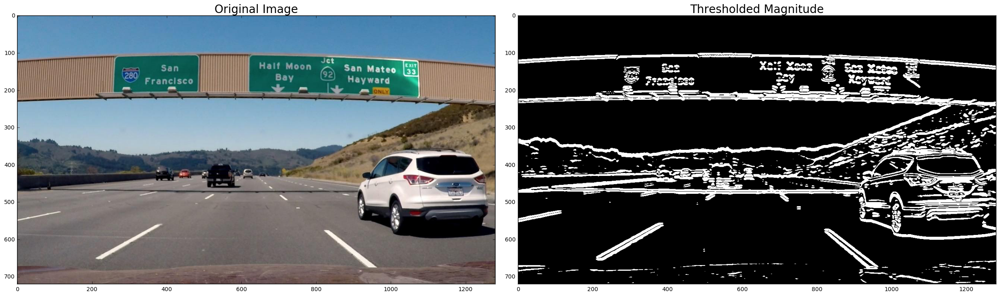

In [39]:
mag_binary = mag_thresh(sobel_kernel=17,mag_thresh_min=20,mag_thresh_max=130)

### direction of the gradient

array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       ..., 
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.]])

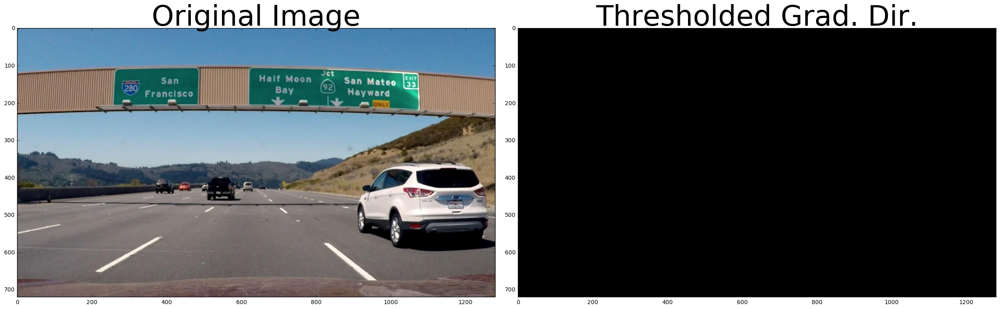

In [40]:
def dir_threshold(sobel_kernel=17, thresh_min=0,thresh_max=np.pi/2):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    abs_sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_xy = np.sqrt((np.square(abs_sobel_x))+(np.square(abs_sobel_y)))
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    gradient_direction = np.arctan2(abs_sobel_y, abs_sobel_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(gradient_direction)
    binary_output[(gradient_direction >= thresh_min) & (gradient_direction <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    # binary_output = np.copy(img) # Remove this line
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary_output, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return binary_output

dir_binary = interact(dir_threshold, sobel_kernel=(1,21), thresh_min=(0.,np.pi/2),thresh_max=(0.,np.pi/2))

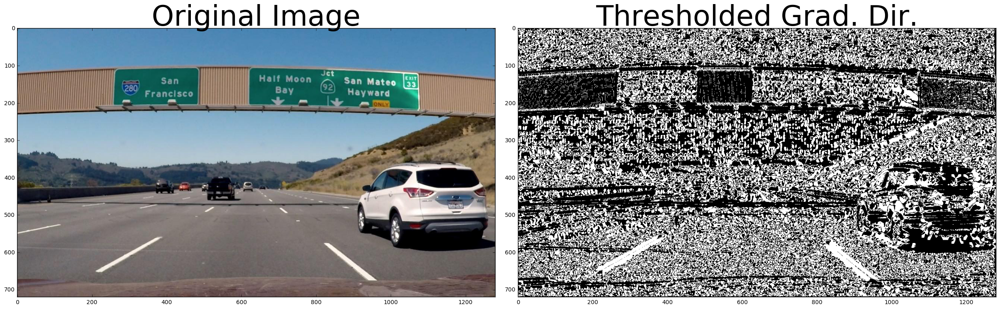

In [41]:
dir_binary = dir_threshold(sobel_kernel=17, thresh_min=0.4,thresh_max=1.3)

### combining thresholds

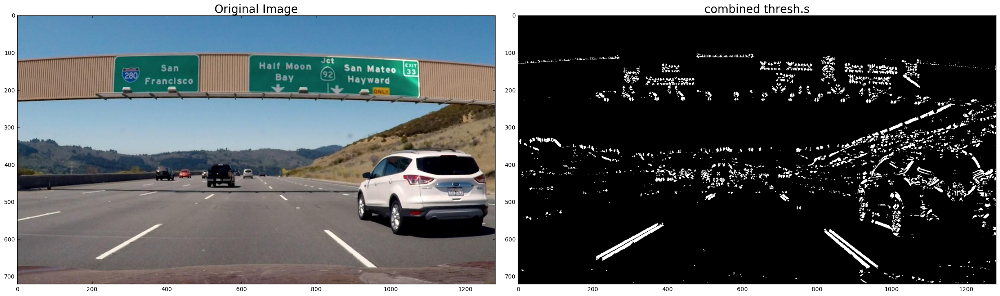

In [42]:
# Apply each of the thresholding functions
combined = np.zeros_like(dir_binary)
combined[((binary_outputx == 1) & (binary_outputy == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(combined, cmap='gray')
ax2.set_title('combined thresh.s', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### HLS and colour threshold

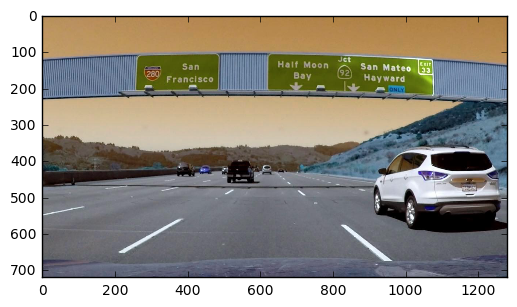

In [43]:
img = cv2.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/signs_vehicles_xygrad.png')
plt.imshow(img)

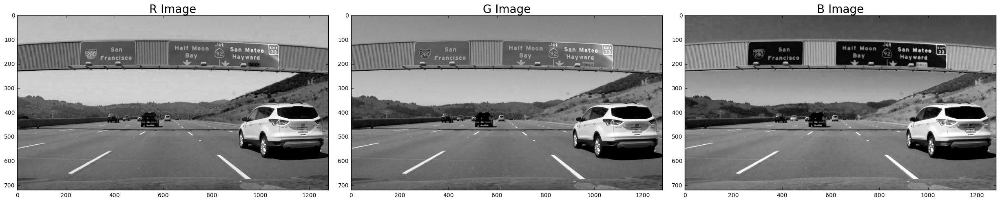

In [44]:
R = img[:,:,0]
G = img[:,:,1]
B = img[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(R, cmap='gray')
ax1.set_title('R Image', fontsize=20)
ax2.imshow(G, cmap='gray')
ax2.set_title('G Image', fontsize=20)
ax3.imshow(B, cmap='gray')
ax3.set_title('B Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

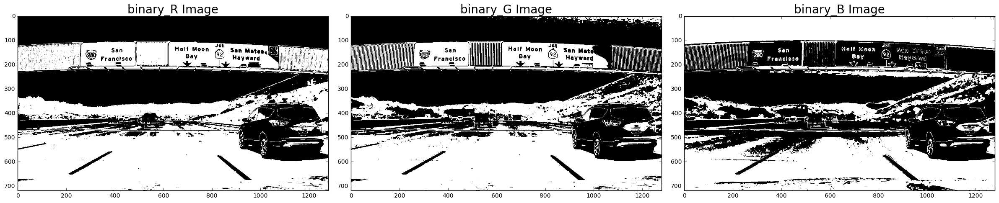

In [45]:
def channel_thresh(thresh_min, thresh_max):
    binary_R = np.zeros_like(R)
    binary_R[(R > thresh_min) & (R <= thresh_max)] = 1
    
    binary_G = np.zeros_like(G)
    binary_G[(G > thresh_min) & (G <= thresh_max)] = 1
    
    binary_B = np.zeros_like(B)
    binary_B[(B > thresh_min) & (B <= thresh_max)] = 1
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(binary_R, cmap='gray')
    ax1.set_title('binary_R Image', fontsize=20)
    ax2.imshow(binary_G, cmap='gray')
    ax2.set_title('binary_G Image', fontsize=20)
    ax3.imshow(binary_B, cmap='gray')
    ax3.set_title('binary_B Image', fontsize=20)
    
interact(channel_thresh,thresh_min=(0,255), thresh_max=(0,255))

### HLS color channels

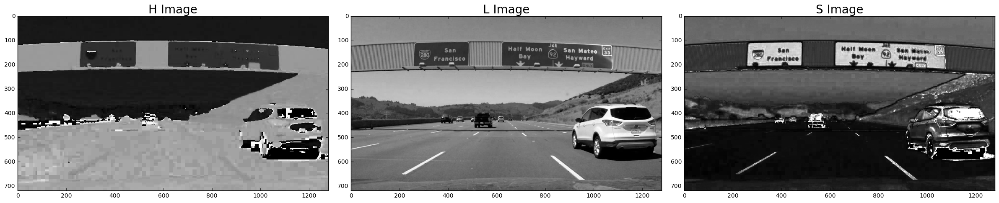

In [46]:
# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H, cmap='gray')
ax1.set_title('H Image', fontsize=20)
ax2.imshow(L, cmap='gray')
ax2.set_title('L Image', fontsize=20)
ax3.imshow(S, cmap='gray')
ax3.set_title('S Image', fontsize=20)

<function __main__.HLS_channel_thresh>

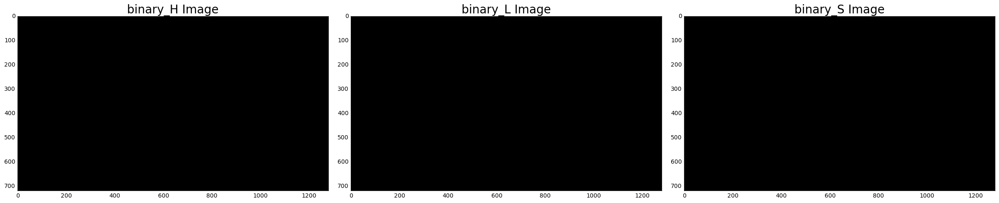

In [47]:
def HLS_channel_thresh(thresh_min, thresh_max):
    binary_H = np.zeros_like(H)
    binary_H[(H > thresh_min) & (H <= thresh_max)] = 1
    
    binary_L = np.zeros_like(L)
    binary_L[(L > thresh_min) & (L <= thresh_max)] = 1
    
    binary_S = np.zeros_like(S)
    binary_S[(S > thresh_min) & (S <= thresh_max)] = 1
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(binary_H, cmap='gray')
    ax1.set_title('binary_H Image', fontsize=20)
    ax2.imshow(binary_L, cmap='gray')
    ax2.set_title('binary_L Image', fontsize=20)
    ax3.imshow(binary_S, cmap='gray')
    ax3.set_title('binary_S Image', fontsize=20)
    
interact(HLS_channel_thresh,thresh_min=(0,255), thresh_max=(0,255))

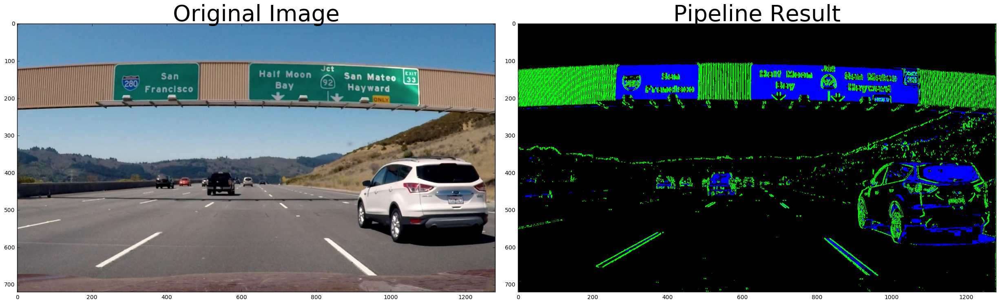

In [48]:
image = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/signs_vehicles_xygrad.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

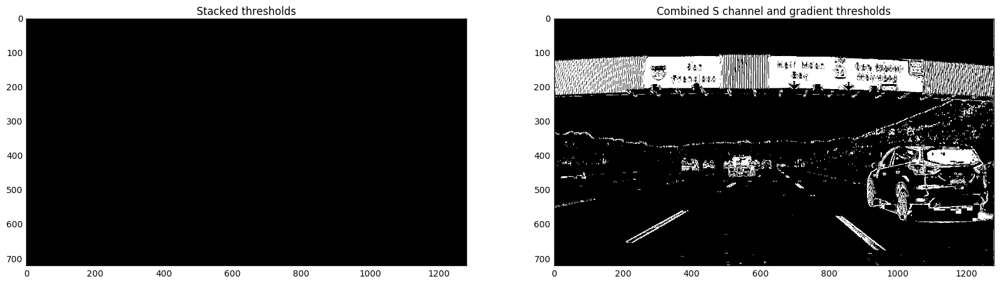

In [49]:
# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 170
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

In [27]:
# Edit this function to create your own pipeline.
def pipeline(s_thresh=(170, 255), sx_thresh=(20, 100)):
    #r channel of the original picture
    R_thresh = (200,255)
    R_channel = img[:,:,0]
    R_binary = np.zeros_like(R_channel)
    R_binary[(R_channel > R_thresh[0]) & (R_channel <= R_thresh[1])] = 1
    
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(R_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary,R_channel,R_binary,s_channel,scaled_sobel,sxbinary
    
result,R_channel,R_binary,s_channel,scaled_sobel,sxbinary = pipeline(img)

# Plot the result
f, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(7, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(R_channel)
ax2.set_title('R_channel Result', fontsize=40)

ax3.imshow(R_binary)
ax3.set_title('R_binary Result', fontsize=40)

ax4.imshow(s_channel)
ax4.set_title('s_channel Result', fontsize=40)

ax5.imshow(scaled_sobel)
ax5.set_title('scaled_sobel Result', fontsize=40)

ax6.imshow(sxbinary)
ax6.set_title('sxbinary Result', fontsize=40)

ax7.imshow(result)
ax7.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

UnboundLocalError: local variable 'img' referenced before assignment

## Perspective Transform

### Sliding window 

In [20]:
# Read in a thresholded image
warped = mpimg.imread('warped_example.jpg')
# window settings
window_width = 80 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
	    # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channle 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'warped_example.jpg'

### Measure curvature

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images